<a href="https://colab.research.google.com/github/YoussefDiaa1/Covid_Analysis/blob/main/Covid19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import numpy as np

file_path = '/content/drive/MyDrive/Data/WHO-COVID-19-global-daily-data.csv'
df = pd.read_csv(file_path)


print("CSV file loaded successfully! Here are the first few rows:")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
CSV file loaded successfully! Here are the first few rows:


# Data Inspection

In [5]:
df.head()

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-01-04,NE,Niger,AFR,NaN,0,NaN,0
1,2020-01-04,NO,Norway,EUR,NaN,0,NaN,0
2,2020-01-04,PW,Palau,WPR,0.0,0,0.0,0
3,2020-01-04,PY,Paraguay,AMR,NaN,0,NaN,0
4,2020-01-04,PN,Pitcairn,WPR,0.0,0,0.0,0


In [6]:
df.shape

(487680, 8)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 487680 entries, 0 to 487679
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Date_reported      487680 non-null  object 
 1   Country_code       485648 non-null  object 
 2   Country            487680 non-null  object 
 3   WHO_region         487680 non-null  object 
 4   New_cases          210274 non-null  float64
 5   Cumulative_cases   487680 non-null  int64  
 6   New_deaths         153909 non-null  float64
 7   Cumulative_deaths  487680 non-null  int64  
dtypes: float64(2), int64(2), object(4)
memory usage: 29.8+ MB


In [8]:
df.describe()

,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
count,2.102740e+05,4.876800e+05,153909.000000,4.876800e+05
mean,3.702112e+03,2.040467e+06,46.127095,2.164831e+04
std,4.857198e+04,8.511593e+06,242.408071,8.673084e+04
min,-6.507900e+04,0.000000e+00,-3520.000000,0.000000e+00
25%,3.000000e+00,6.589000e+03,0.000000,4.000000e+01
50%,6.100000e+01,5.900850e+04,2.000000,6.900000e+02
75%,6.770000e+02,6.608540e+05,15.000000,7.924000e+03
max,6.966046e+06,1.034368e+08,44047.000000,1.225927e+06


In [9]:
print(df.isnull().sum())

Date_reported             0
Country_code           2032
Country                   0
WHO_region                0
New_cases            277406
Cumulative_cases          0
New_deaths           333771
Cumulative_deaths         0
dtype: int64


In [10]:
df1 = df.copy()

In [11]:
df2 = df.copy()

# Data Cleaning

In [12]:
print(df1.isnull().sum())

Date_reported             0
Country_code           2032
Country                   0
WHO_region                0
New_cases            277406
Cumulative_cases          0
New_deaths           333771
Cumulative_deaths         0
dtype: int64


In [13]:
# Convert 'Date_reported' to datetime objects
df1['Date_reported'] = pd.to_datetime(df1['Date_reported'])

print(df1.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 487680 entries, 0 to 487679
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Date_reported      487680 non-null  datetime64[ns]
 1   Country_code       485648 non-null  object        
 2   Country            487680 non-null  object        
 3   WHO_region         487680 non-null  object        
 4   New_cases          210274 non-null  float64       
 5   Cumulative_cases   487680 non-null  int64         
 6   New_deaths         153909 non-null  float64       
 7   Cumulative_deaths  487680 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(2), object(3)
memory usage: 29.8+ MB
None


In [14]:
# Find rows with NaN in 'Country_code' column
nan_rows = df1.loc[df1['Country_code'].isna()]
print("\nRows with NaN in Country_code column:")
nan_rows


Rows with NaN in Country_code column:


,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
148,2020-01-04,NaN,Namibia,AFR,NaN,0,NaN,0
300,2020-01-05,NaN,Namibia,AFR,NaN,0,NaN,0
682,2020-01-06,NaN,Namibia,AFR,NaN,0,NaN,0
780,2020-01-07,NaN,Namibia,AFR,NaN,0,NaN,0
1110,2020-01-08,NaN,Namibia,AFR,NaN,0,NaN,0
...,...,...,...,...,...,...,...,...
486540,2025-07-23,NaN,Namibia,AFR,NaN,172557,NaN,4110
486868,2025-07-24,NaN,Namibia,AFR,NaN,172557,NaN,4110
487021,2025-07-25,NaN,Namibia,AFR,NaN,172557,NaN,4110
487352,2025-07-26,NaN,Namibia,AFR,NaN,172557,NaN,4110


In [15]:
# First, let's see which countries have missing codes
countries_with_missing_codes = df1[df1['Country_code'].isnull()]['Country'].unique()
print("Countries with missing country codes:")
print(countries_with_missing_codes)
print(f"Number of countries with missing codes: {len(countries_with_missing_codes)}")

Countries with missing country codes:
['Namibia']
Number of countries with missing codes: 1


In [16]:
country_code_mapping = {
    'Namibia': 'NAM'
}

df1['Country_code'] = df1.apply(
    lambda row: country_code_mapping.get(row['Country'], row['Country_code'])
    if pd.isnull(row['Country_code']) else row['Country_code'],
    axis=1
)


In [17]:
# Verify we've handled all missing country codes
print(f"Remaining missing country codes: {df1['Country_code'].isnull().sum()}")

Remaining missing country codes: 0


In [18]:
df1['Country_code'].isna().sum()

np.int64(0)

In [19]:
df1[486540 : 487498]

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
486540,2025-07-23,NAM,Namibia,AFR,NaN,172557,NaN,4110
486541,2025-07-23,NL,Netherlands (Kingdom of the),EUR,NaN,8651413,NaN,22986
486542,2025-07-23,MS,Montserrat,AMR,NaN,1403,NaN,8
486543,2025-07-23,YT,Mayotte,AFR,NaN,42027,NaN,187
486544,2025-07-23,MU,Mauritius,AFR,NaN,332068,NaN,1074
...,...,...,...,...,...,...,...,...
487493,2025-07-27,RO,Romania,EUR,NaN,3570697,NaN,68966
487494,2025-07-27,PS,"occupied Palestinian territory, including east...",EMR,NaN,703228,NaN,5708
487495,2025-07-27,QA,Qatar,EMR,NaN,514524,NaN,690
487496,2025-07-27,PR,Puerto Rico,AMR,NaN,1252713,NaN,5938


In [20]:
# Sort the data by Country and Date to ensure proper time sequence
df1.sort_values(by=['Country', 'Date_reported'], inplace=True)


# We're creating new columns with different names to avoid confusion
df1['New_cases_calculated'] = df1.groupby('Country')['Cumulative_cases'].transform(
    lambda x: x.diff().fillna(x)  # Fill NaN with the first value
).clip(lower=0)

df1['New_deaths_calculated'] = df1.groupby('Country')['Cumulative_deaths'].transform(
    lambda x: x.diff().fillna(x)  # Fill NaN with the first value
).clip(lower=0)


df1.drop(['New_cases', 'New_deaths'], axis=1, inplace=True, errors='ignore')


df1.rename(columns={
    'New_cases_calculated': 'New_cases',
    'New_deaths_calculated': 'New_deaths'
}, inplace=True)

In [21]:
#  Check for any remaining missing values
print("Missing values after processing:")
print(df1.isnull().sum())

#  Verify that no negative values exist in the new columns
print("\nNegative values check:")
print(f"Negative New_cases: {(df1['New_cases'] < 0).sum()}")
print(f"Negative New_deaths: {(df1['New_deaths'] < 0).sum()}")

#  Check the consistency between cumulative and new values

consistency_check = df1.groupby('Country').agg({
    'New_cases': 'sum',
    'Cumulative_cases': 'last'
})
consistency_check['Difference'] = consistency_check['Cumulative_cases'] - consistency_check['New_cases']
print("\nConsistency check between cumulative and sum of new cases:")
print(consistency_check['Difference'].describe())


sample_country = 'United States of America'  # Change to a country in your dataset
sample_data = df1[df1['Country'] == sample_country].sort_values('Date_reported')
print(f"\nSample verification for {sample_country}:")
print(sample_data[['Date_reported', 'Cumulative_cases', 'New_cases', 'Cumulative_deaths', 'New_deaths']].head(10))

Missing values after processing:
Date_reported        0
Country_code         0
Country              0
WHO_region           0
Cumulative_cases     0
Cumulative_deaths    0
New_cases            0
New_deaths           0
dtype: int64

Negative values check:
Negative New_cases: 0
Negative New_deaths: 0

Consistency check between cumulative and sum of new cases:
count      240.000000
mean      -340.608333
std       4270.992493
min     -65079.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.000000
Name: Difference, dtype: float64

Sample verification for United States of America:
     Date_reported  Cumulative_cases  New_cases  Cumulative_deaths  New_deaths
62      2020-01-04                 0        0.0                  0         0.0
436     2020-01-05                 0        0.0                  0         0.0
542     2020-01-06                 0        0.0                  0         0.0
916     2020-01-07                 0        0.0                  

In [22]:

print("\nData quality checks:")

# Check for unusually high values (potential outliers)
print("Top 5 highest New_cases values:")
print(df1.nlargest(5, 'New_cases')[['Country', 'Date_reported', 'New_cases', 'Cumulative_cases']])

print("\nTop 5 highest New_deaths values:")
print(df1.nlargest(5, 'New_deaths')[['Country', 'Date_reported', 'New_deaths', 'Cumulative_deaths']])

# Check for countries with zero cases but non-zero deaths (data quality issue)
anomaly = df1[(df1['Cumulative_cases'] == 0) & (df1['Cumulative_deaths'] > 0)]
if not anomaly.empty:
    print("\nAnomaly detected: Countries with zero cases but non-zero deaths:")
    print(anomaly[['Country', 'Date_reported', 'Cumulative_cases', 'Cumulative_deaths']])
else:
    print("\nNo anomalies detected for zero cases with non-zero deaths")


Data quality checks:
Top 5 highest New_cases values:
       Country Date_reported  New_cases  Cumulative_cases
260336   China    2022-12-23  6966046.0          50447985
260007   China    2022-12-22  6434648.0          43481939
260487   China    2022-12-24  6327801.0          56775786
259857   China    2022-12-21  5905312.0          37047291
260816   China    2022-12-25  5669864.0          62445650

Top 5 highest New_deaths values:
        Country Date_reported  New_deaths  Cumulative_deaths
269937    China    2023-02-01     44047.0             113926
193993    Chile    2022-03-22     11447.0              55965
269810    Japan    2023-02-01      9903.0              68399
135439  Ecuador    2021-07-21      8786.0              30744
84377   Germany    2020-12-20      6460.0              41281

Anomaly detected: Countries with zero cases but non-zero deaths:
        Country Date_reported  Cumulative_cases  Cumulative_deaths
19715  Botswana    2020-03-26                 0                  

In [23]:
df1['Date_reported'] = pd.to_datetime(df1['Date_reported'])


df_clean = df1.copy()


df_clean.reset_index(drop=True, inplace=True)

# Display final dataset info
print("\nFinal dataset info:")
print(f"Shape: {df_clean.shape}")
print(f"Date range: {df_clean['Date_reported'].min()} to {df_clean['Date_reported'].max()}")
print(f"Number of countries: {df_clean['Country'].nunique()}")


Final dataset info:
Shape: (487680, 8)
Date range: 2020-01-04 00:00:00 to 2025-07-27 00:00:00
Number of countries: 240


In [24]:
df1

,Date_reported,Country_code,Country,WHO_region,Cumulative_cases,Cumulative_deaths,New_cases,New_deaths
209,2020-01-04,AF,Afghanistan,EMR,0,0,0.0,0.0
275,2020-01-05,AF,Afghanistan,EMR,0,0,0.0,0.0
690,2020-01-06,AF,Afghanistan,EMR,0,0,0.0,0.0
755,2020-01-07,AF,Afghanistan,EMR,0,0,0.0,0.0
1169,2020-01-08,AF,Afghanistan,EMR,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...
486538,2025-07-23,PS,"occupied Palestinian territory, including east...",EMR,703228,5708,0.0,0.0
486871,2025-07-24,PS,"occupied Palestinian territory, including east...",EMR,703228,5708,0.0,0.0
487018,2025-07-25,PS,"occupied Palestinian territory, including east...",EMR,703228,5708,0.0,0.0
487355,2025-07-26,PS,"occupied Palestinian territory, including east...",EMR,703228,5708,0.0,0.0


In [25]:
df2

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-01-04,NE,Niger,AFR,NaN,0,NaN,0
1,2020-01-04,NO,Norway,EUR,NaN,0,NaN,0
2,2020-01-04,PW,Palau,WPR,0.0,0,0.0,0
3,2020-01-04,PY,Paraguay,AMR,NaN,0,NaN,0
4,2020-01-04,PN,Pitcairn,WPR,0.0,0,0.0,0
...,...,...,...,...,...,...,...,...
487675,2025-07-27,BA,Bosnia and Herzegovina,EUR,NaN,404287,NaN,16406
487676,2025-07-27,CA,Canada,AMR,NaN,4819055,NaN,55282
487677,2025-07-27,BT,Bhutan,SEAR,NaN,63075,NaN,21
487678,2025-07-27,AZ,Azerbaijan,EUR,NaN,836510,NaN,10353


In [26]:
unique_values = df1['New_cases'].unique().tolist()
unique_values

[0.0,
 1.0,
 3.0,
 6.0,
 2.0,
 16.0,
 32.0,
 11.0,
 15.0,
 8.0,
 52.0,
 26.0,
 60.0,
 20.0,
 25.0,
 38.0,
 30.0,
 56.0,
 21.0,
 40.0,
 37.0,
 34.0,
 58.0,
 73.0,
 51.0,
 63.0,
 66.0,
 84.0,
 50.0,
 104.0,
 133.0,
 68.0,
 172.0,
 124.0,
 110.0,
 234.0,
 298.0,
 755.0,
 168.0,
 171.0,
 478.0,
 361.0,
 262.0,
 303.0,
 259.0,
 413.0,
 414.0,
 349.0,
 408.0,
 581.0,
 567.0,
 910.0,
 736.0,
 716.0,
 512.0,
 737.0,
 548.0,
 637.0,
 643.0,
 784.0,
 651.0,
 656.0,
 742.0,
 775.0,
 624.0,
 1078.0,
 582.0,
 791.0,
 575.0,
 305.0,
 920.0,
 748.0,
 556.0,
 664.0,
 761.0,
 106.0,
 1241.0,
 463.0,
 541.0,
 419.0,
 536.0,
 310.0,
 338.0,
 159.0,
 535.0,
 85.0,
 356.0,
 351.0,
 271.0,
 121.0,
 403.0,
 260.0,
 302.0,
 348.0,
 279.0,
 113.0,
 320.0,
 210.0,
 59.0,
 157.0,
 100.0,
 4.0,
 285.0,
 200.0,
 130.0,
 186.0,
 112.0,
 188.0,
 55.0,
 105.0,
 103.0,
 71.0,
 82.0,
 67.0,
 41.0,
 78.0,
 39.0,
 215.0,
 76.0,
 79.0,
 7.0,
 120.0,
 45.0,
 160.0,
 97.0,
 46.0,
 43.0,
 19.0,
 47.0,
 94.0,
 96.0,
 24.0,
 2

In [27]:
df1['New_cases'].value_counts()

,count
New_cases,
0.0,317379
1.0,7149
2.0,4716
3.0,3671
4.0,3065
...,...
10597.0,1
7128.0,1
18463.0,1


In [29]:
# Check zeros, NaNs, and percentages for New_cases & New_deaths

total_rows = len(df1)

cases_zeros = (df1['New_cases'] == 0).sum()
deaths_zeros = (df1['New_deaths'] == 0).sum()

cases_nans = df1['New_cases'].isna().sum()
deaths_nans = df1['New_deaths'].isna().sum()

cases_zeros_ratio = (cases_zeros / total_rows) * 100
deaths_zeros_ratio = (deaths_zeros / total_rows) * 100
cases_nans_ratio = (cases_nans / total_rows) * 100
deaths_nans_ratio = (deaths_nans / total_rows) * 100

print("=== New Cases ===")
print(f"Zeros: {cases_zeros} ({cases_zeros_ratio:.2f}%)")
print(f"NaNs:  {cases_nans} ({cases_nans_ratio:.2f}%)")
print("\n=== New Deaths ===")
print(f"Zeros: {deaths_zeros} ({deaths_zeros_ratio:.2f}%)")
print(f"NaNs:  {deaths_nans} ({deaths_nans_ratio:.2f}%)")


=== New Cases ===
Zeros: 317379 (65.08%)
NaNs:  0 (0.00%)

=== New Deaths ===
Zeros: 388623 (79.69%)
NaNs:  0 (0.00%)


# Feature Engineering

In [30]:
# ===== 1. DATE-BASED FEATURES =====
df1['Year'] = df1['Date_reported'].dt.year
df1['Month'] = df1['Date_reported'].dt.month
df1['Day'] = df1['Date_reported'].dt.day
df1['Weekday'] = df1['Date_reported'].dt.day_name()


In [31]:
# ===== 2. GROWTH-BASED FEATURES =====
# Daily case growth rate (percentage change)
df1['Case_Growth_Rate'] = df1.groupby('Country')['New_cases'].pct_change().replace([np.inf, -np.inf], 0).fillna(0)

# Daily death growth rate
df1['Death_Growth_Rate'] = df1.groupby('Country')['New_deaths'].pct_change().replace([np.inf, -np.inf], 0).fillna(0)

# Mortality rate = cumulative deaths / cumulative cases
df1['Mortality_Rate'] = (df1['Cumulative_deaths'] / df1['Cumulative_cases']).replace([np.inf, np.nan], 0)


In [32]:
# ===== 3. FLAGS / INDICATORS =====
# Whether the country reported any new cases or deaths
df1['Had_New_Cases'] = np.where(df1['New_cases'] > 0, 1, 0)
df1['Had_New_Deaths'] = np.where(df1['New_deaths'] > 0, 1, 0)


In [33]:
# ===== 4. MOVING AVERAGES =====
# 7-day rolling averages for smoothing trends
df1['Cases_MA7'] = df1.groupby('Country')['New_cases'].transform(lambda x: x.rolling(7).mean())
df1['Deaths_MA7'] = df1.groupby('Country')['New_deaths'].transform(lambda x: x.rolling(7).mean())


In [34]:
# ===== 5. CUMULATIVE FEATURES =====
# Total cases & deaths per country until each date
df1['Total_Cases_Till_Date'] = df1.groupby('Country')['New_cases'].cumsum()
df1['Total_Deaths_Till_Date'] = df1.groupby('Country')['New_deaths'].cumsum()


In [35]:
# ===== 6. COUNTRY-LEVEL AGGREGATES =====
# Maximum cases & deaths reported in a single day for each country
df1['Max_Daily_Cases'] = df1.groupby('Country')['New_cases'].transform('max')
df1['Max_Daily_Deaths'] = df1.groupby('Country')['New_deaths'].transform('max')

# Preview new features
df1.head(10)

,Date_reported,Country_code,Country,WHO_region,Cumulative_cases,Cumulative_deaths,New_cases,New_deaths,Year,Month,...,Death_Growth_Rate,Mortality_Rate,Had_New_Cases,Had_New_Deaths,Cases_MA7,Deaths_MA7,Total_Cases_Till_Date,Total_Deaths_Till_Date,Max_Daily_Cases,Max_Daily_Deaths
209,2020-01-04,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,NaN,NaN,0.0,0.0,3243.0,159.0
275,2020-01-05,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,NaN,NaN,0.0,0.0,3243.0,159.0
690,2020-01-06,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,NaN,NaN,0.0,0.0,3243.0,159.0
755,2020-01-07,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,NaN,NaN,0.0,0.0,3243.0,159.0
1169,2020-01-08,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,NaN,NaN,0.0,0.0,3243.0,159.0
1235,2020-01-09,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,NaN,NaN,0.0,0.0,3243.0,159.0
1650,2020-01-10,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
1716,2020-01-11,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
2129,2020-01-12,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
2195,2020-01-13,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0


In [36]:
df1['Cases_MA7'].isna().sum()

np.int64(1440)

In [37]:
df1['Deaths_MA7'].isna().sum()

np.int64(1440)

In [38]:
df1 = df1.dropna(subset=['Cases_MA7', 'Deaths_MA7'])

In [39]:
df1.head(10)

,Date_reported,Country_code,Country,WHO_region,Cumulative_cases,Cumulative_deaths,New_cases,New_deaths,Year,Month,...,Death_Growth_Rate,Mortality_Rate,Had_New_Cases,Had_New_Deaths,Cases_MA7,Deaths_MA7,Total_Cases_Till_Date,Total_Deaths_Till_Date,Max_Daily_Cases,Max_Daily_Deaths
1650,2020-01-10,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
1716,2020-01-11,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
2129,2020-01-12,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
2195,2020-01-13,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
2610,2020-01-14,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
2675,2020-01-15,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
3089,2020-01-16,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
3156,2020-01-17,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
3569,2020-01-18,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0
3636,2020-01-19,AF,Afghanistan,EMR,0,0,0.0,0.0,2020,1,...,0.0,0.0,0,0,0.0,0.0,0.0,0.0,3243.0,159.0


In [40]:
df1.describe()

,Date_reported,Cumulative_cases,Cumulative_deaths,New_cases,New_deaths,Year,Month,Day,Case_Growth_Rate,Death_Growth_Rate,Mortality_Rate,Had_New_Cases,Had_New_Deaths,Cases_MA7,Deaths_MA7,Total_Cases_Till_Date,Total_Deaths_Till_Date,Max_Daily_Cases,Max_Daily_Deaths
count,486240,4.862400e+05,4.862400e+05,4.862400e+05,486240.000000,486240.000000,486240.000000,486240.000000,486240.000000,486240.000000,486240.000000,486240.000000,486240.000000,4.862400e+05,486240.000000,4.862400e+05,4.862400e+05,4.862400e+05,486240.000000
mean,2022-10-18 12:00:00.000000512,2.046510e+06,2.171242e+04,1.601143e+03,14.614168,2022.316881,6.282823,15.747779,0.056108,0.007421,0.087188,0.350230,0.203718,1.601119e+03,14.614127,2.046662e+06,2.172624e+04,8.888073e+04,641.833333
min,2020-01-10 00:00:00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2020.000000,1.000000,1.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,2021-05-30 00:00:00,6.607000e+03,4.100000e+01,0.000000e+00,0.000000,2021.000000,3.000000,8.000000,0.000000,0.000000,0.003186,0.000000,0.000000,0.000000e+00,0.000000,6.607000e+03,4.100000e+01,9.285000e+02,7.750000
50%,2022-10-18 12:00:00,6.078150e+04,6.900000e+02,0.000000e+00,0.000000,2022.000000,6.000000,16.000000,0.000000,0.000000,0.009443,0.000000,0.000000,2.285714e+00,0.000000,6.079300e+04,7.000000e+02,3.704000e+03,45.000000
75%,2024-03-08 00:00:00,6.611030e+05,7.977500e+03,2.800000e+01,0.000000,2024.000000,9.000000,23.000000,0.000000,0.000000,0.019250,1.000000,0.000000,1.000000e+02,0.857143,6.611030e+05,7.979250e+03,1.997825e+04,170.000000
max,2025-07-27 00:00:00,1.034368e+08,1.225927e+06,6.966046e+06,44047.000000,2025.000000,12.000000,31.000000,2137.000000,1756.200000,1038.750000,1.000000,1.000000,5.882129e+06,6829.714286,1.034368e+08,1.228364e+06,6.966046e+06,44047.000000
std,NaN,8.523462e+06,8.685116e+04,3.199377e+04,137.918956,1.615964,3.407572,8.774808,4.566417,3.526147,7.484119,0.477042,0.402762,2.873731e+04,105.915222,8.523492e+06,8.693401e+04,4.998482e+05,3159.984426


In [41]:
df1[['New_cases', 'New_deaths', 'Cumulative_cases', 'Cumulative_deaths']].isna().sum()


,0
New_cases,0
New_deaths,0
Cumulative_cases,0
Cumulative_deaths,0


# Univariate Analysis

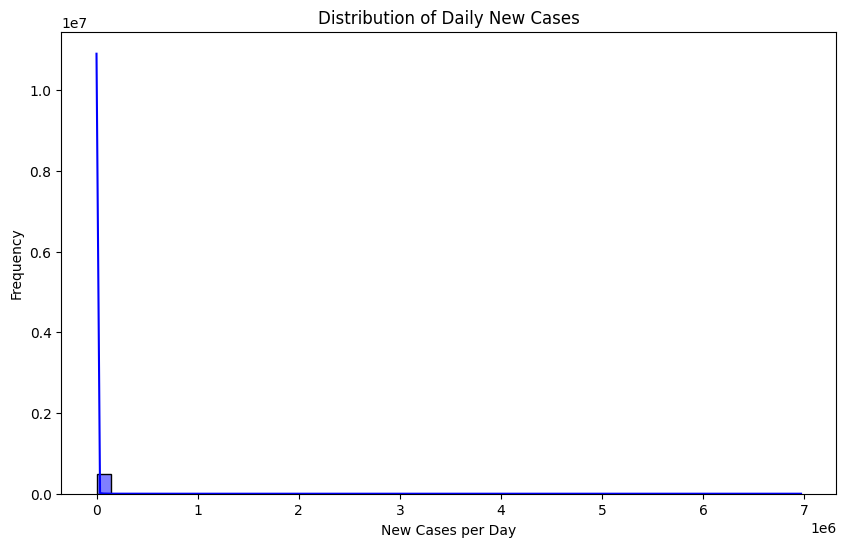

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.histplot(df1['New_cases'], bins=50, kde=True, color='blue')
plt.title('Distribution of Daily New Cases')
plt.xlabel('New Cases per Day')
plt.ylabel('Frequency')
plt.show()


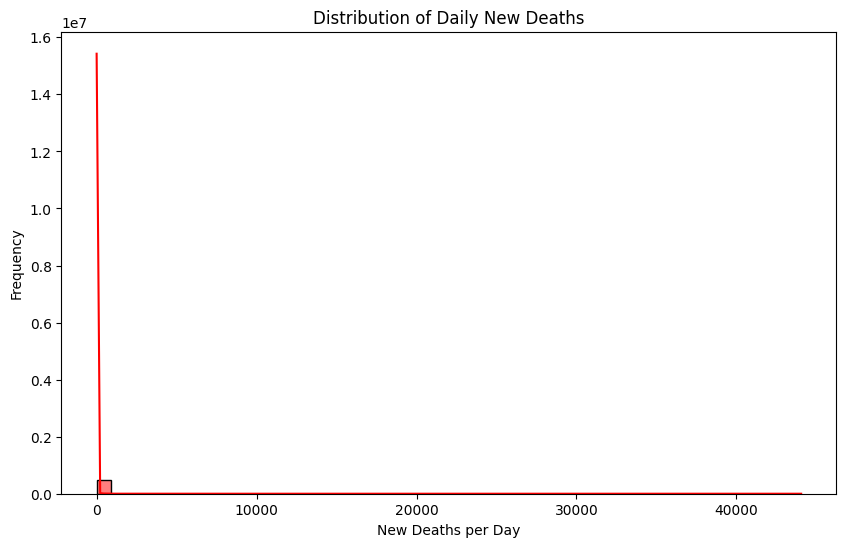

In [43]:
plt.figure(figsize=(10,6))
sns.histplot(df1['New_deaths'], bins=50, kde=True, color='red')
plt.title('Distribution of Daily New Deaths')
plt.xlabel('New Deaths per Day')
plt.ylabel('Frequency')
plt.show()


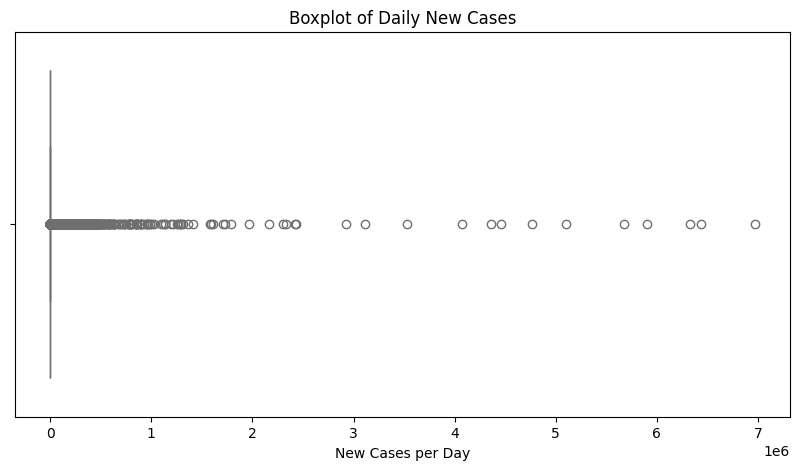

In [45]:
plt.figure(figsize=(10,5))
sns.boxplot(x=df1['New_cases'], color='skyblue')
plt.title('Boxplot of Daily New Cases')
plt.xlabel('New Cases per Day')
plt.show()

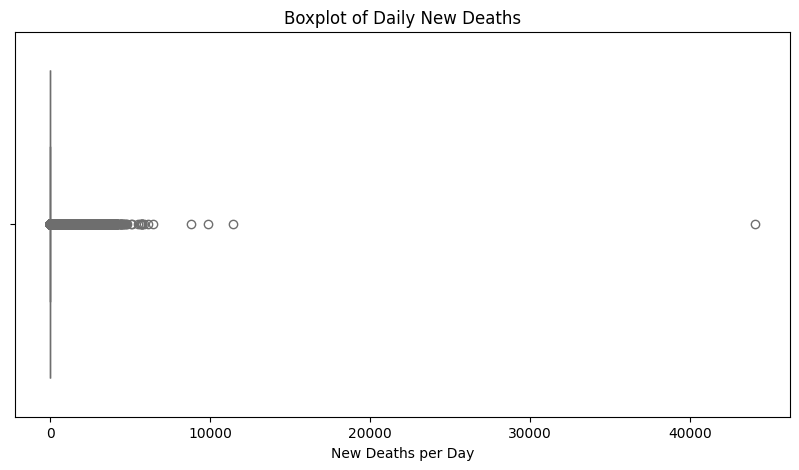

In [46]:
plt.figure(figsize=(10,5))
sns.boxplot(x=df1['New_deaths'], color='lightcoral')
plt.title('Boxplot of Daily New Deaths')
plt.xlabel('New Deaths per Day')
plt.show()

/tmp/ipython-input-4150254188.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cases.values, y=top_cases.index, palette="Blues_r")


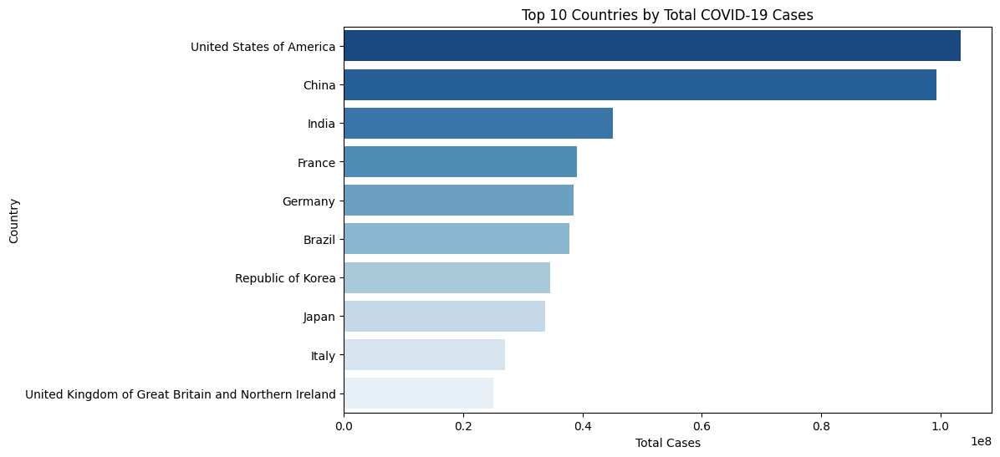

In [47]:
top_cases = df1.groupby('Country')['Cumulative_cases'].max().sort_values(ascending=False).head(10)

plt.figure(figsize=(10,6))
sns.barplot(x=top_cases.values, y=top_cases.index, palette="Blues_r")
plt.title('Top 10 Countries by Total COVID-19 Cases')
plt.xlabel('Total Cases')
plt.ylabel('Country')
plt.show()


/tmp/ipython-input-3706254534.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Date_reported'] = pd.to_datetime(df1['Date_reported'])


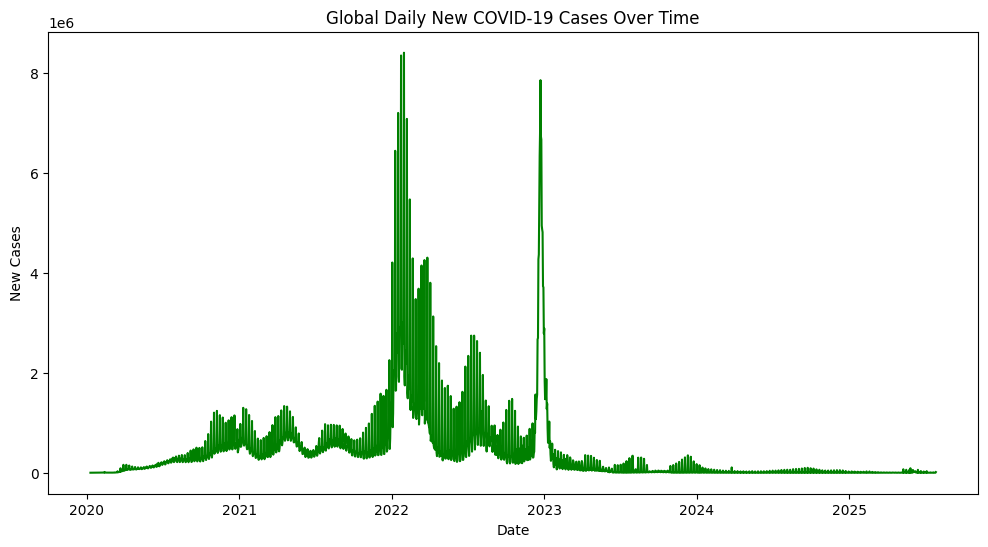

In [48]:
df1['Date_reported'] = pd.to_datetime(df1['Date_reported'])
global_cases = df1.groupby('Date_reported')['New_cases'].sum()

plt.figure(figsize=(12,6))
plt.plot(global_cases.index, global_cases.values, color='green')
plt.title('Global Daily New COVID-19 Cases Over Time')
plt.xlabel('Date')
plt.ylabel('New Cases')
plt.show()


In [49]:
import plotly.express as px

fig = px.bar(
    top_cases.reset_index(),
    x='Cumulative_cases',
    y='Country',
    orientation='h',
    title='Top 10 Countries by Total Cases (Interactive)',
    color='Cumulative_cases'
)
fig.show()


# Bivariate Analysis

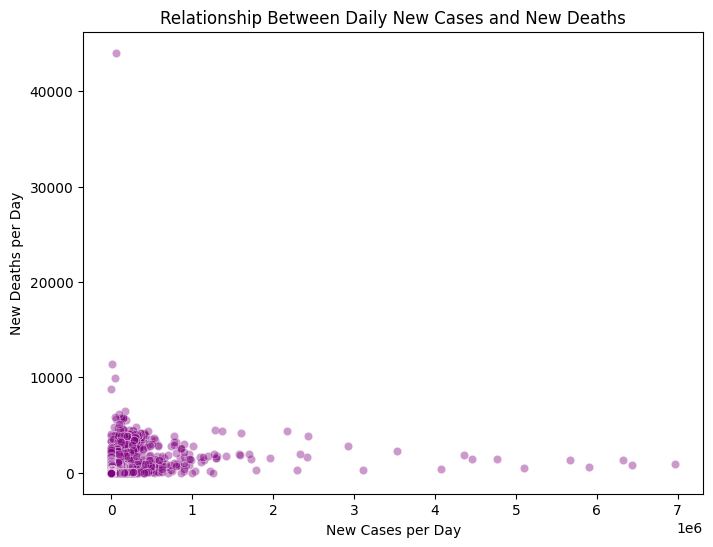

In [50]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=df1, x='New_cases', y='New_deaths', alpha=0.4, color='purple')
plt.title('Relationship Between Daily New Cases and New Deaths')
plt.xlabel('New Cases per Day')
plt.ylabel('New Deaths per Day')
plt.show()

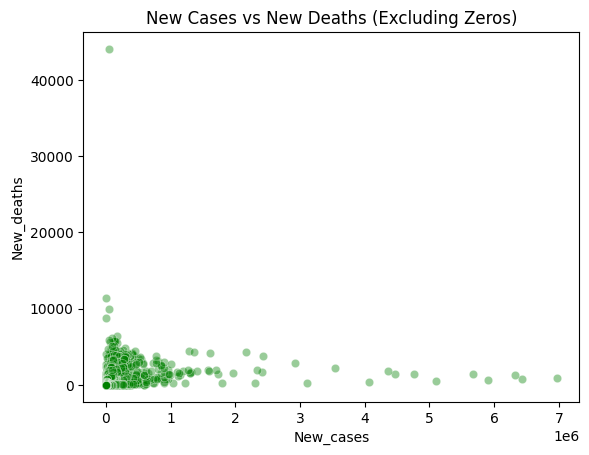

In [51]:
df_nonzero = df1[(df1['New_cases'] > 0) & (df1['New_deaths'] > 0)]
sns.scatterplot(data=df_nonzero, x='New_cases', y='New_deaths', alpha=0.4, color='green')
plt.title('New Cases vs New Deaths (Excluding Zeros)')
plt.show()


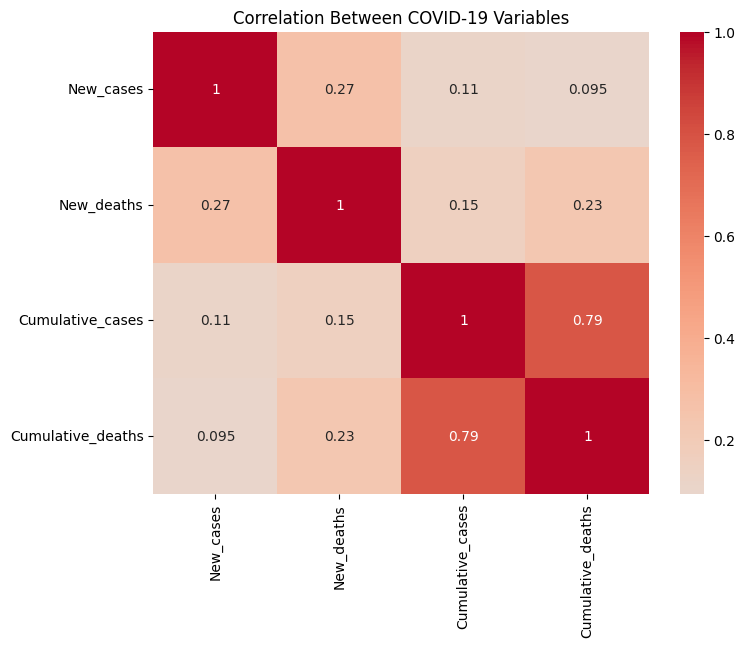

In [52]:
plt.figure(figsize=(8,6))
sns.heatmap(df1[['New_cases', 'New_deaths', 'Cumulative_cases', 'Cumulative_deaths']].corr(),
            annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Between COVID-19 Variables')
plt.show()


<Figure size 1200x600 with 0 Axes>

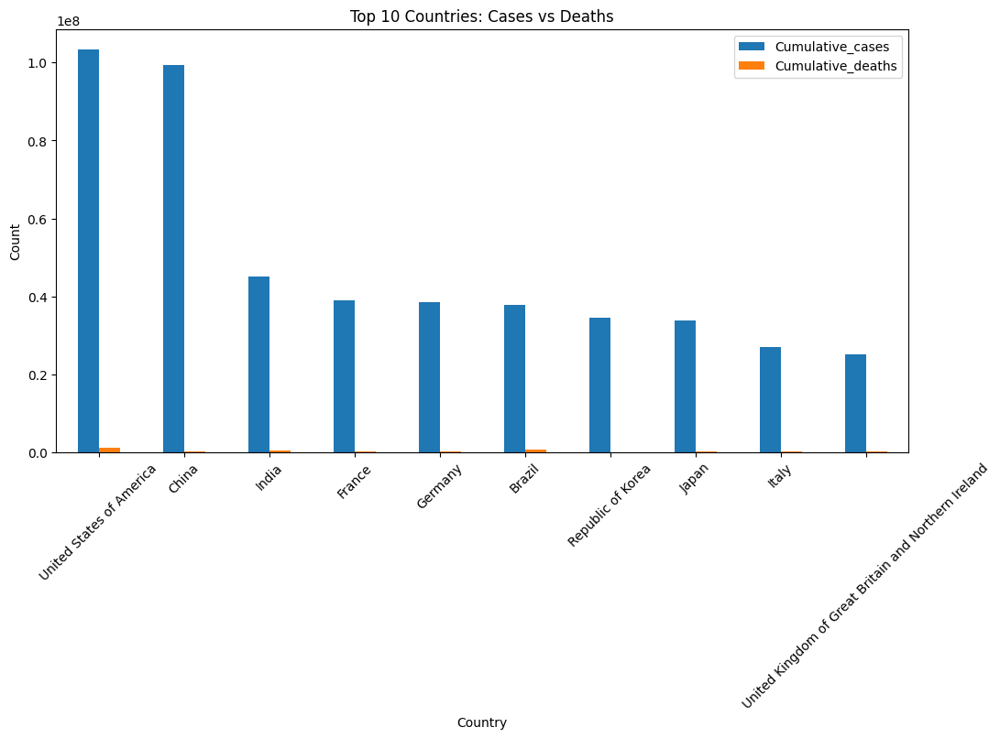

In [54]:
top_countries = df1.groupby('Country')[['Cumulative_cases', 'Cumulative_deaths']].max()
top_countries = top_countries.sort_values(by='Cumulative_cases', ascending=False).head(10)

plt.figure(figsize=(12,6))
top_countries[['Cumulative_cases', 'Cumulative_deaths']].plot(kind='bar', figsize=(12,6))
plt.title('Top 10 Countries: Cases vs Deaths')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [59]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Bar(
    x=top_countries.index,
    y=top_countries['Cumulative_cases'],
    name='Cumulative Cases',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=top_countries.index,
    y=top_countries['Cumulative_deaths'],
    name='Cumulative Deaths',
    marker_color='red'
))

fig.update_layout(
    title='Top 10 Countries: Cases vs Deaths',
    xaxis_title='Country',
    yaxis_title='Count',
    barmode='group',
    template='plotly_dark'
)

fig.show()


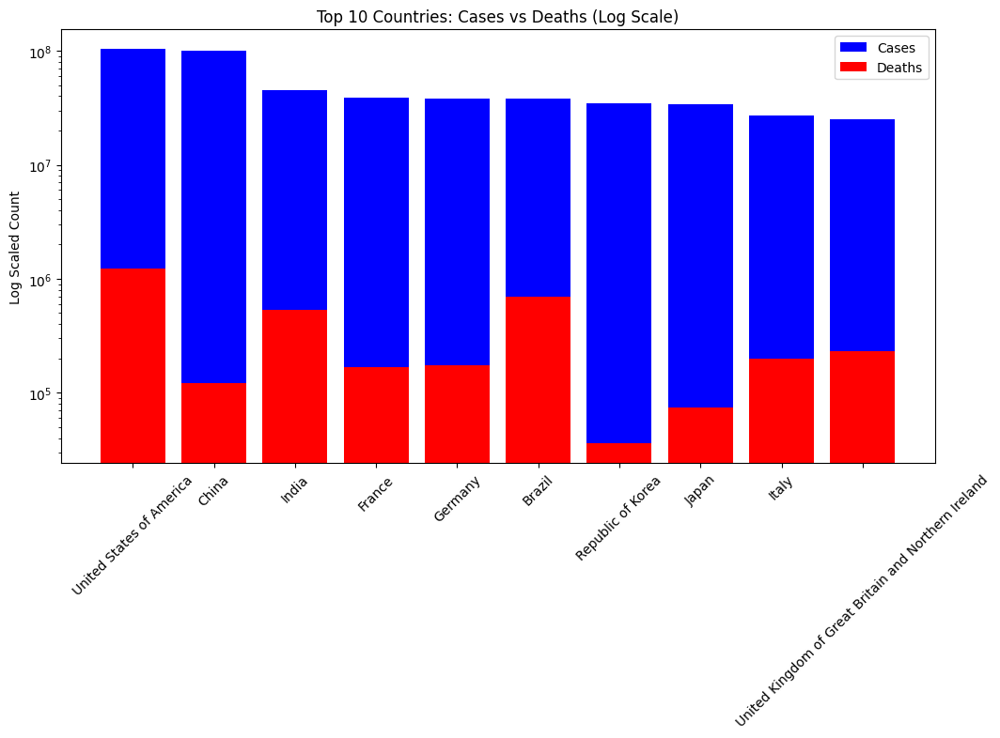

In [58]:
plt.figure(figsize=(12,6))
plt.bar(top_countries.index, top_countries['Cumulative_cases'], label='Cases', color='blue')
plt.bar(top_countries.index, top_countries['Cumulative_deaths'], label='Deaths', color='red')
plt.yscale('log')
plt.title('Top 10 Countries: Cases vs Deaths (Log Scale)')
plt.ylabel('Log Scaled Count')
plt.xticks(rotation=45)
plt.legend()
plt.show()


# Multivariate Analysis

In [60]:
import plotly.express as px

grouped = df1.groupby(['Date_reported', 'Country']).sum().reset_index()

fig = px.scatter_3d(
    grouped,
    x='Date_reported', y='New_cases', z='New_deaths',
    color='Country', size='New_cases',
    title="3D Visualization: Cases vs Deaths vs Time"
)
fig.show()


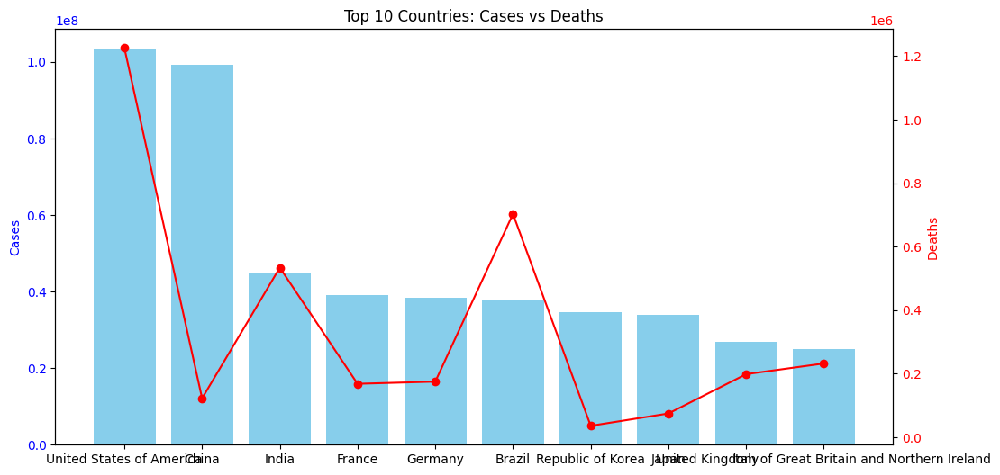

In [61]:
top_countries = df1.groupby('Country')[['Cumulative_cases','Cumulative_deaths']].max().sort_values('Cumulative_cases', ascending=False).head(10)

fig, ax1 = plt.subplots(figsize=(12,6))

# Bar for cases
ax1.bar(top_countries.index, top_countries['Cumulative_cases'], color='skyblue', label='Cumulative Cases')
ax1.set_ylabel('Cases', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Line for deaths on a secondary axis
ax2 = ax1.twinx()
ax2.plot(top_countries.index, top_countries['Cumulative_deaths'], color='red', marker='o', label='Cumulative Deaths')
ax2.set_ylabel('Deaths', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title("Top 10 Countries: Cases vs Deaths")
plt.xticks(rotation=45)
plt.show()


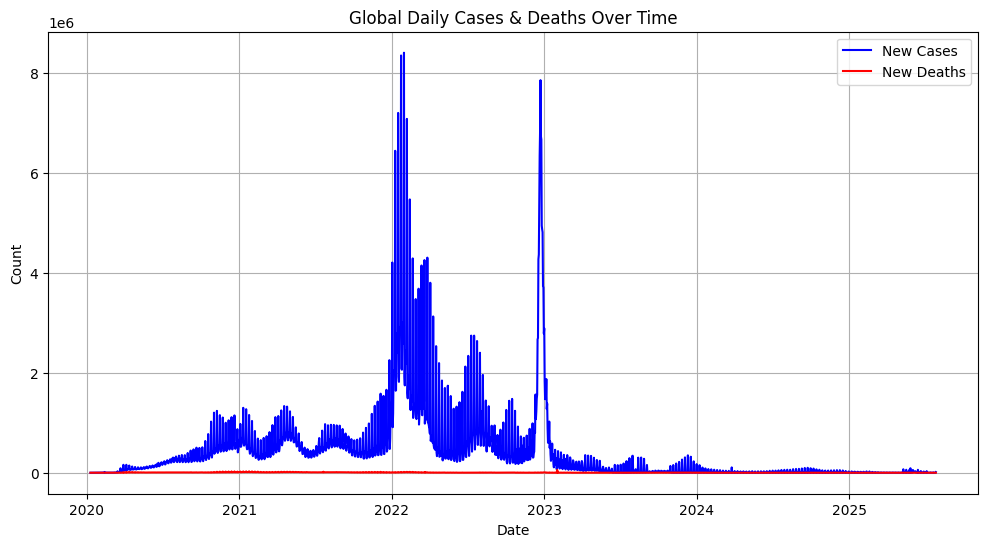

In [62]:
plt.figure(figsize=(12,6))
plt.plot(df1.groupby('Date_reported')['New_cases'].sum(), label='New Cases', color='blue')
plt.plot(df1.groupby('Date_reported')['New_deaths'].sum(), label='New Deaths', color='red')
plt.title("Global Daily Cases & Deaths Over Time")
plt.xlabel("Date")
plt.ylabel("Count")
plt.legend()
plt.grid()
plt.show()


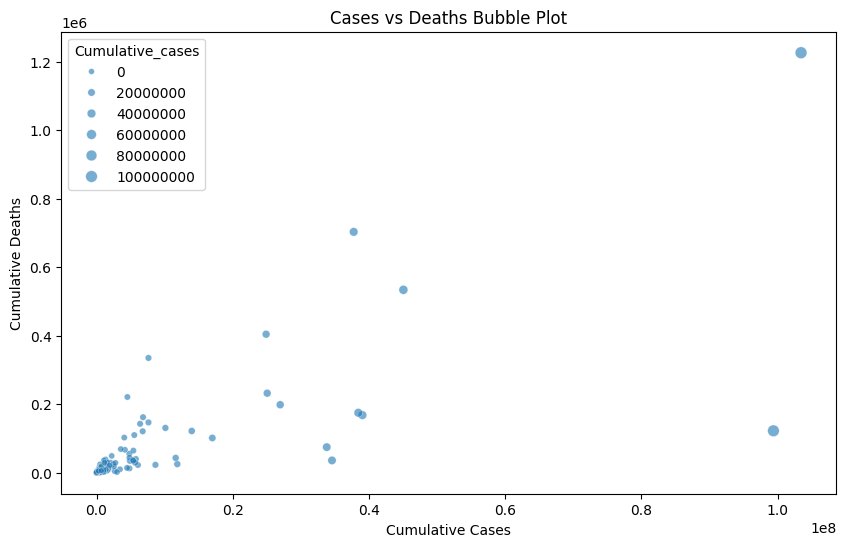

In [63]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="Cumulative_cases",
    y="Cumulative_deaths",
    data=df1.groupby('Country').max().reset_index(),
    size="Cumulative_cases",
    alpha=0.6
)
plt.title("Cases vs Deaths Bubble Plot")
plt.xlabel("Cumulative Cases")
plt.ylabel("Cumulative Deaths")
plt.show()


# Insights



*   65% of reported days had zero new cases, indicating delayed reporting or early pandemic phases.
*   Cumulative cases are heavily right-skewed → A few countries dominate global totals.


*   Countries like the US, India, and Brazil represent a large share of global cases, while many smaller countries reported minimal infections.






*  80% of reported days had zero new deaths → reflects early pandemic stages or incomplete reporting.

*  Cumulative deaths follow the same right-skewed distribution as cases.

*  Death peaks occur shortly after spikes in cases → indicating a lag effect between infections and fatalities.




*   A strong positive correlation (~0.89) exists between Cumulative_cases and Cumulative_deaths.
*   Countries with high cases generally have high deaths, but there are exceptions:
     
     *   Lower death ratios in developed nations → better healthcare & early vaccination.
     *   Higher death ratios in resource-limited countries.


*   Top 10 countries contribute approximately 70-80% of global cases and deaths.


*   Adjusting the visualization using side-by-side bars improved readability, making deaths easier to compare alongside cases.








*  Bubble plots revealed that US, India, and Brazil dominate both cases and deaths, while some countries like China maintained relatively lower death counts despite early exposure.




# Key Takeaways


*   Global inequality: A small set of countries drives the majority of cases and deaths.

*  Healthcare capacity matters: Countries with better infrastructure manage lower death-to-case ratios.


*   Vaccinations work: A noticeable drop in fatalities despite rising cases.

*   Reporting gaps: Large percentages of days with zero new cases/deaths show under-reporting or delayed reporting.



# Small Simple Dashboard

In [70]:

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from dash import Dash, dcc, html
from dash.dependencies import Input, Output
from jupyter_dash import JupyterDash

# ---------------------------

df_dashboard = df1.copy()

# Ensure date column is datetime
df_dashboard['Date_reported'] = pd.to_datetime(df_dashboard['Date_reported'])


total_cases = df_dashboard['Cumulative_cases'].max()
total_deaths = df_dashboard['Cumulative_deaths'].max()
mortality_rate = round((total_deaths / total_cases) * 100, 2)

country_options = [{'label': c, 'value': c} for c in sorted(df_dashboard['Country'].unique())]

# ---------------------------
# 2. Create Dash App

app = JupyterDash(__name__)

app.layout = html.Div(style={'backgroundColor': '#f8f9fa', 'padding': '20px'}, children=[
    html.H1("🌍 COVID-19 Professional Dashboard",
            style={'textAlign': 'center', 'color': '#2c3e50', 'marginBottom': '20px'}),

    # ---------------- KPIs ----------------
    html.Div([
        html.Div([
            html.H3("Total Cases", style={'color': '#3498db'}),
            html.P(f"{total_cases:,}", style={'fontSize': '24px', 'fontWeight': 'bold'})
        ], style={'backgroundColor': '#eaf4fb', 'padding': '15px', 'borderRadius': '10px',
                  'boxShadow': '2px 2px 10px rgba(0,0,0,0.1)', 'width': '30%', 'display': 'inline-block',
                  'textAlign': 'center', 'margin': '10px'}),

        html.Div([
            html.H3("Total Deaths", style={'color': '#e74c3c'}),
            html.P(f"{total_deaths:,}", style={'fontSize': '24px', 'fontWeight': 'bold'})
        ], style={'backgroundColor': '#fdecea', 'padding': '15px', 'borderRadius': '10px',
                  'boxShadow': '2px 2px 10px rgba(0,0,0,0.1)', 'width': '30%', 'display': 'inline-block',
                  'textAlign': 'center', 'margin': '10px'}),

        html.Div([
            html.H3("Mortality Rate", style={'color': '#27ae60'}),
            html.P(f"{mortality_rate}%", style={'fontSize': '24px', 'fontWeight': 'bold'})
        ], style={'backgroundColor': '#eafaf1', 'padding': '15px', 'borderRadius': '10px',
                  'boxShadow': '2px 2px 10px rgba(0,0,0,0.1)', 'width': '30%', 'display': 'inline-block',
                  'textAlign': 'center', 'margin': '10px'}),
    ], style={'textAlign': 'center', 'marginBottom': '30px'}),

    # ---------------- Country Dropdown ----------------
    html.Div([
        html.Label("Select Country:", style={'fontSize': '18px'}),
        dcc.Dropdown(
            id='country-dropdown',
            options=country_options,
            value='Egypt',
            style={'width': '50%'}
        )
    ], style={'textAlign': 'center', 'marginBottom': '30px'}),

    # ---------------- Line Chart ----------------
    dcc.Graph(id='line-chart'),

    # ---------------- Interactive Top 10 ----------------
    html.Div([
        html.Label("Select Metric:", style={'fontSize': '18px'}),
        dcc.RadioItems(
            id='metric-selector',
            options=[
                {'label': 'Cumulative Cases', 'value': 'Cumulative_cases'},
                {'label': 'Cumulative Deaths', 'value': 'Cumulative_deaths'}
            ],
            value='Cumulative_cases',
            inline=True
        )
    ], style={'textAlign': 'center', 'margin': '20px'}),

    dcc.Graph(id='top10-bar'),

    # ---------------- Moving Average Chart ----------------
    dcc.Graph(id='moving-average'),

    # ---------------- World Map ----------------
    dcc.Graph(id='choropleth-map')
])

# ---------------------------
# 3. Callbacks

@app.callback(
    Output('line-chart', 'figure'),
    Input('country-dropdown', 'value')
)
def update_line_chart(selected_country):
    filtered_df = df_dashboard[df_dashboard['Country'] == selected_country]
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=filtered_df['Date_reported'], y=filtered_df['New_cases'],
        mode='lines', name='New Cases', line=dict(color='#3498db', width=2)
    ))
    fig.add_trace(go.Scatter(
        x=filtered_df['Date_reported'], y=filtered_df['New_deaths'],
        mode='lines', name='New Deaths', line=dict(color='#e74c3c', width=2)
    ))
    fig.update_layout(
        title=f"Daily COVID-19 Cases & Deaths in {selected_country}",
        xaxis_title="Date",
        yaxis_title="Count",
        template='plotly_white'
    )
    return fig

@app.callback(
    Output('top10-bar', 'figure'),
    Input('metric-selector', 'value')
)
def update_top10_bar(metric):
    top10_df = df_dashboard.groupby("Country")[metric].max().sort_values(ascending=False).head(10).reset_index()
    fig = px.bar(top10_df, x='Country', y=metric,
                 color=metric, color_continuous_scale='Blues' if metric == 'Cumulative_cases' else 'Reds')
    fig.update_layout(
        title=f"Top 10 Countries by {metric.replace('_', ' ')}",
        template='plotly_white'
    )
    return fig


@app.callback(
    Output('moving-average', 'figure'),
    Input('country-dropdown', 'value')
)
def update_moving_average(selected_country):
    filtered_df = df_dashboard[df_dashboard['Country'] == selected_country]
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=filtered_df['Date_reported'], y=filtered_df['Cases_MA7'],
        mode='lines', name='7-Day Avg Cases', line=dict(color='#1abc9c', width=2)
    ))
    fig.add_trace(go.Scatter(
        x=filtered_df['Date_reported'], y=filtered_df['Deaths_MA7'],
        mode='lines', name='7-Day Avg Deaths', line=dict(color='#f39c12', width=2)
    ))
    fig.update_layout(
        title=f"7-Day Moving Averages - {selected_country}",
        xaxis_title="Date",
        yaxis_title="Count",
        template='plotly_white'
    )
    return fig


@app.callback(
    Output('choropleth-map', 'figure'),
    Input('metric-selector', 'value')
)
def update_choropleth(metric):
    country_latest = df_dashboard.groupby("Country")[metric].max().reset_index()
    fig = px.choropleth(
        country_latest,
        locations="Country",
        locationmode="country names",
        color=metric,
        hover_name="Country",
        color_continuous_scale="Blues" if metric == 'Cumulative_cases' else 'Reds',
        title=f"Global COVID-19 Spread by {metric.replace('_', ' ')}"
    )
    fig.update_layout(geo=dict(showframe=False, showcoastlines=True))
    return fig

# ---------------------------
# 4. Run Dashboard
app.run_server(mode="external", port = 8050)


Dash app running on:
Try `serve_kernel_port_as_iframe` instead. 


<IPython.core.display.Javascript object>